In [1]:
!pip install rdkit-pypi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 36.8 MB 28 kB/s 


qm9.csv 파일을 다운로드 받습니다. (출처 : https://github.com/deepchem/deepchem/blob/master/deepchem/molnet/load_function/qm9_datasets.py )

In [2]:
!wget https://deepchemdata.s3-us-west-1.amazonaws.com/datasets/qm9.csv

--2022-09-21 08:37:00--  https://deepchemdata.s3-us-west-1.amazonaws.com/datasets/qm9.csv
Resolving deepchemdata.s3-us-west-1.amazonaws.com (deepchemdata.s3-us-west-1.amazonaws.com)... 52.219.113.82
Connecting to deepchemdata.s3-us-west-1.amazonaws.com (deepchemdata.s3-us-west-1.amazonaws.com)|52.219.113.82|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29856825 (28M) [text/csv]
Saving to: ‘qm9.csv’

qm9.csv             100%[===================>]  28.47M  77.1MB/s    in 0.4s    

2022-09-21 08:37:01 (77.1 MB/s) - ‘qm9.csv’ saved [29856825/29856825]



In [3]:
import rdkit
from rdkit import Chem
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw

import networkx as nx

import pandas as pd
import numpy as np
from tqdm import tqdm

import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go

IPythonConsole.ipython_useSVG=True # jupyter notebook에서 시각화 하기위해 True로 설정해 줍니다

In [4]:
df = pd.read_csv('/content/qm9.csv')

파이썬에서 분자 관련된 데이터를 다룰때에는 rdkit이라는 패키지를 사용합니다.

분자구조를 문자열로 표현한것을 smiles라고 하고 분자 데이터의 가장 기본이 됩니다.

smiles를 가지고 다양한 형태로 바꾸어 분석 및 모델링 작업을 하지만 이번 그래프 시각화 과정에서는 그래프로 바꾸어 다뤄 보겠습니다.


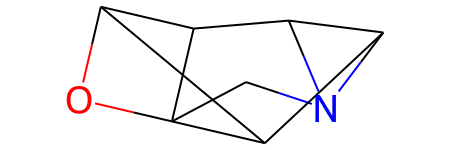

In [5]:
smiles = 'C1N2C3C2C2C4OC12C34'
mol = Chem.MolFromSmiles(smiles) # 해당 함수를 사용하여 smiles를 molecule로 바꾼다.
mol

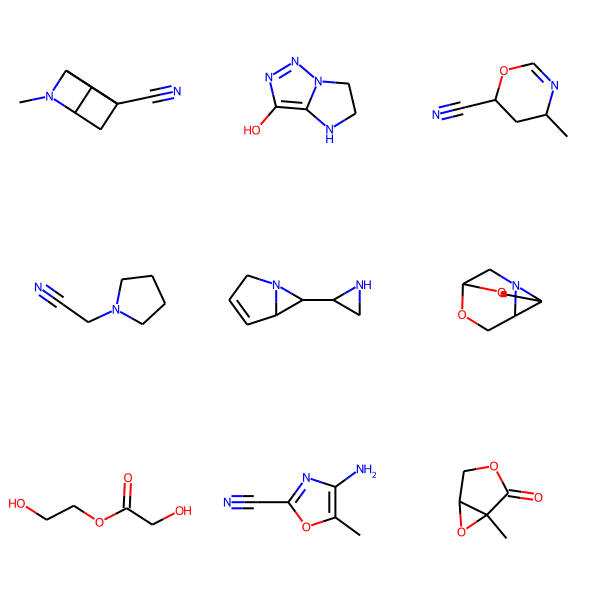

In [19]:
mol_list = [Chem.MolFromSmiles(smiles) for smiles in df['smiles'].sample(9)]

Draw.MolsToGridImage(mol_list, molsPerRow=3) # 2개 이상 시각화를 할때는 MolsToGridImage 함수를 사용합니다.

Mol 내부에는 다양한 함수들이 내장되어 있습니다.

먼저 분자는 수 많은 원자로 이루어졌듯이 Mol 내부에 있는 원자(atom)들을 꺼내보겠습니다.

In [7]:
for atom in mol.GetAtoms():
  print(atom.GetSymbol()) # GetSymbol을 이용하면 각 원자의 symbol을 출력할 수 있다.

C
N
C
C
C
C
O
C
C


다음은 Mol을 이용하여 그래프로 바꿔서 시각화 해보겠습니다.

그래프로 바꿀때는 networkx라는 패키지를 사용해줍니다.

먼저 그래프는 노드와 엣지로 이루어져 있고 각 노드와 엣지에는 연결 정보 이외에도 각각의 특성들을 넣을 수 있습니다. 

소셜 그래프를 예를들면 사람(노드) 소셜 연결 상태(엣지)가 있으면 연결 정보이외에 사람이라는 노드안에는 직장, 거주지 등 다양한 특성이 들어가 있고 소셜 연결 상태라는 엣지안에는 친구, like, listen 등 정보가 들어갈 수 있습니다.

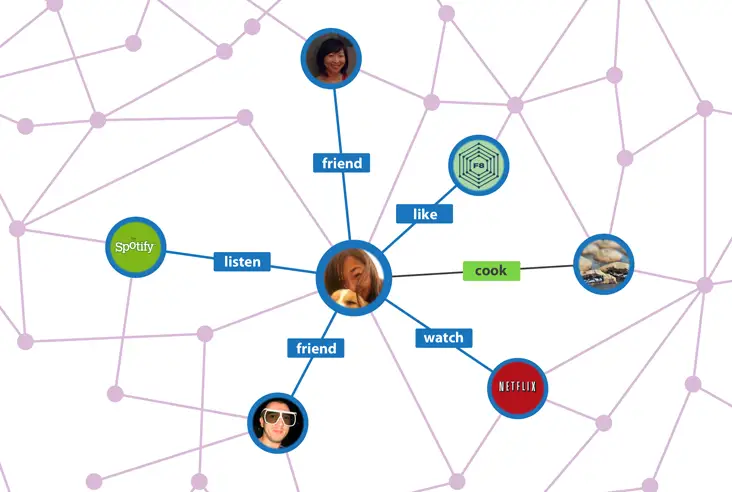


분자 데이터 경우를 살펴보면 각 원자와 원자사이 연결 정보이외에 atomic_num, formal_charge, chiral_tag, hybridization, num_explicit_hs, is_aromatic이라는 노드 특성 정보가 들어가 있고 bond_type이라는 엣지 특성 정보가 들어가 있습니다.

In [8]:
def mol_to_graph(mol):
    G = nx.Graph()

    for atom in mol.GetAtoms():
        G.add_node(atom.GetIdx(),
                   atomic_num=atom.GetAtomicNum(),
                   formal_charge=atom.GetFormalCharge(),
                   chiral_tag=atom.GetChiralTag(),
                   hybridization=atom.GetHybridization(),
                   num_explicit_hs=atom.GetNumExplicitHs(),
                   is_aromatic=atom.GetIsAromatic())
    for bond in mol.GetBonds():
        G.add_edge(bond.GetBeginAtomIdx(),
                   bond.GetEndAtomIdx(),
                   bond_type=bond.GetBondType())
    return G

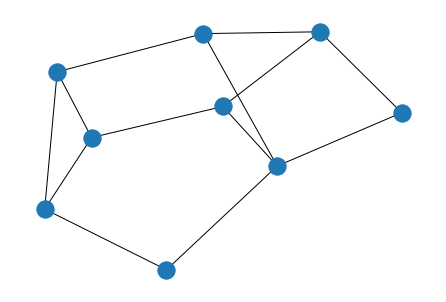

In [9]:
smiles = 'C1N2C3C2C2C4OC12C34'
mol = Chem.MolFromSmiles(smiles)

graph = mol_to_graph(mol)
nx.draw(graph)

그래프 정보 이외에 분자에는 속성 정보가 포함되어 있습니다.

해당 qm9 데이터셋에서는 mol_id와 smiles를 제외한 컬럼들이 속성 정보가 됩니다. 

속성 정보를 시각화 하기 전에 '분자 원자 수'라는 분자 정보를 추가 해줍니다. 분자 원자수는 분자의 속성 정보를 구분하는데 중요한 요소가 될 수 있습니다. 

In [10]:
smiles_list = df['smiles'].tolist()

num_atoms_list = []
for smiles in tqdm(smiles_list, desc='Get atoms'):
    mol = Chem.MolFromSmiles(smiles)
    n_atoms = len(mol.GetAtoms())
    num_atoms_list.append(n_atoms)
df['n_atoms'] = num_atoms_list

Get atoms: 100%|██████████| 133885/133885 [00:07<00:00, 17634.92it/s]


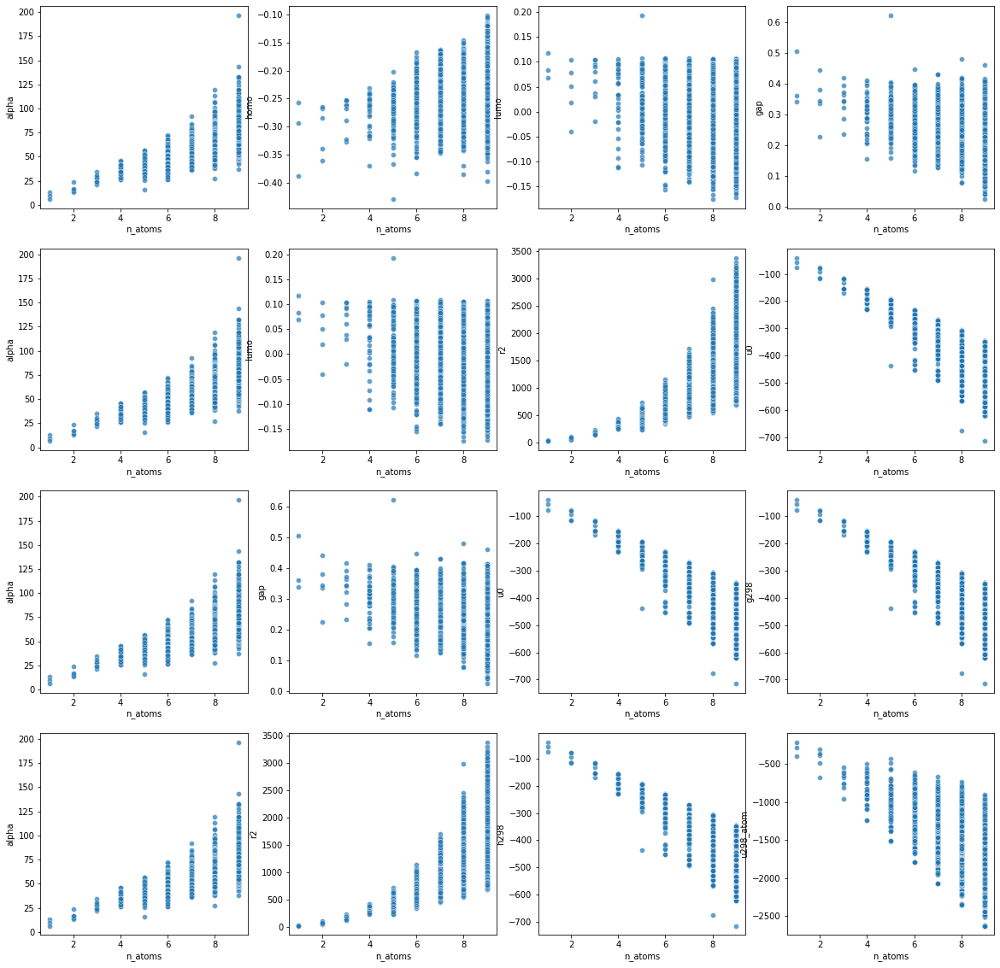

In [11]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(4, 4, figsize=(20, 20))
columns = df.columns[6:22]

for i in range(4):
    for j in range(4):
        sns.scatterplot(data=df, x='n_atoms', y=columns[(i+1) * (j)], alpha=0.7, ax=ax[i][j])

In [12]:
fig = make_subplots(rows=4, cols=4)

for i in range(4):
    for j in range(4):
        fig.add_trace(
            go.Histogram(
                x=df[columns[(i+1) * (j)]],
                name=columns[(i+1) * (j)],
            ),
            row=i+1, col=j+1
        )
fig.show()